# Question :
Train a LinearSVC on a linearly separable dataset. Then train an SVC and a
SGDClassifier on the same dataset. See if you can get them to produce roughly
the same model

# problem Definition
classification water quality that is safe or not safe

# import Libraries & Load Data

In [1]:
import numpy as np
import pandas as pd

In [2]:
df = pd.read_csv('waterQuality1.csv')

In [3]:
df

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,1.65,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,...,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,1
1,2.32,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,...,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,1
2,1.01,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,...,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0
3,1.36,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,...,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,1
4,0.92,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,...,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7991,0.05,7.78,0.00,1.95,0.040,0.10,0.03,0.03,1.37,0.00,...,0.197,14.29,1.00,0.005,3.57,2.13,0.09,0.06,0.03,1
7992,0.05,24.22,0.02,0.59,0.010,0.45,0.02,0.02,1.48,0.00,...,0.031,10.27,1.00,0.001,1.48,1.11,0.09,0.10,0.08,1
7993,0.09,6.85,0.00,0.61,0.030,0.05,0.05,0.02,0.91,0.00,...,0.182,15.92,1.00,0.000,1.35,4.84,0.00,0.04,0.05,1
7994,0.01,10.00,0.01,2.00,0.000,2.00,0.00,0.09,0.00,0.00,...,0.000,0.00,0.00,0.000,0.00,0.00,0.00,0.00,0.00,1


In [4]:
df.columns

Index(['aluminium', 'ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine',
       'chromium', 'copper', 'flouride', 'bacteria', 'viruses', 'lead',
       'nitrates', 'nitrites', 'mercury', 'perchlorate', 'radium', 'selenium',
       'silver', 'uranium', 'is_safe'],
      dtype='object')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7996 entries, 0 to 7995
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   aluminium    7996 non-null   float64
 1   ammonia      7996 non-null   float64
 2   arsenic      7996 non-null   float64
 3   barium       7996 non-null   float64
 4   cadmium      7996 non-null   float64
 5   chloramine   7996 non-null   float64
 6   chromium     7996 non-null   float64
 7   copper       7996 non-null   float64
 8   flouride     7996 non-null   float64
 9   bacteria     7996 non-null   float64
 10  viruses      7996 non-null   float64
 11  lead         7996 non-null   float64
 12  nitrates     7996 non-null   float64
 13  nitrites     7996 non-null   float64
 14  mercury      7996 non-null   float64
 15  perchlorate  7996 non-null   float64
 16  radium       7996 non-null   float64
 17  selenium     7996 non-null   float64
 18  silver       7996 non-null   float64
 19  uraniu

# Data preparation

## 1. Expolratory Data Analysis - EDA

In [6]:
df.describe()

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
count,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,...,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000
mean,0.666396,14.278212,0.161477,1.567928,0.042803,2.177589,0.247300,0.805940,0.771646,0.319714,...,0.099431,9.819250,1.329846,0.005193,16.465266,2.920106,0.049684,0.147811,0.044672,0.114057
std,1.265323,8.878930,0.252632,1.216227,0.036049,2.567210,0.270663,0.653595,0.435423,0.329497,...,0.058169,5.541977,0.573271,0.002967,17.688827,2.322805,0.028773,0.143569,0.026906,0.317900
min,0.000000,-0.080000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.040000,6.577500,0.030000,0.560000,0.008000,0.100000,0.050000,0.090000,0.407500,0.000000,...,0.048000,5.000000,1.000000,0.003000,2.170000,0.820000,0.020000,0.040000,0.020000,0.000000
50%,0.070000,14.130000,0.050000,1.190000,0.040000,0.530000,0.090000,0.750000,0.770000,0.220000,...,0.102000,9.930000,1.420000,0.005000,7.745000,2.410000,0.050000,0.080000,0.050000,0.000000
75%,0.280000,22.132500,0.100000,2.482500,0.070000,4.240000,0.440000,1.390000,1.160000,0.610000,...,0.151000,14.610000,1.760000,0.008000,29.487500,4.670000,0.070000,0.240000,0.070000,0.000000
max,5.050000,29.840000,1.050000,4.940000,0.130000,8.680000,0.900000,2.000000,1.500000,1.000000,...,0.200000,19.830000,2.930000,0.010000,60.010000,7.990000,0.100000,0.500000,0.090000,1.000000


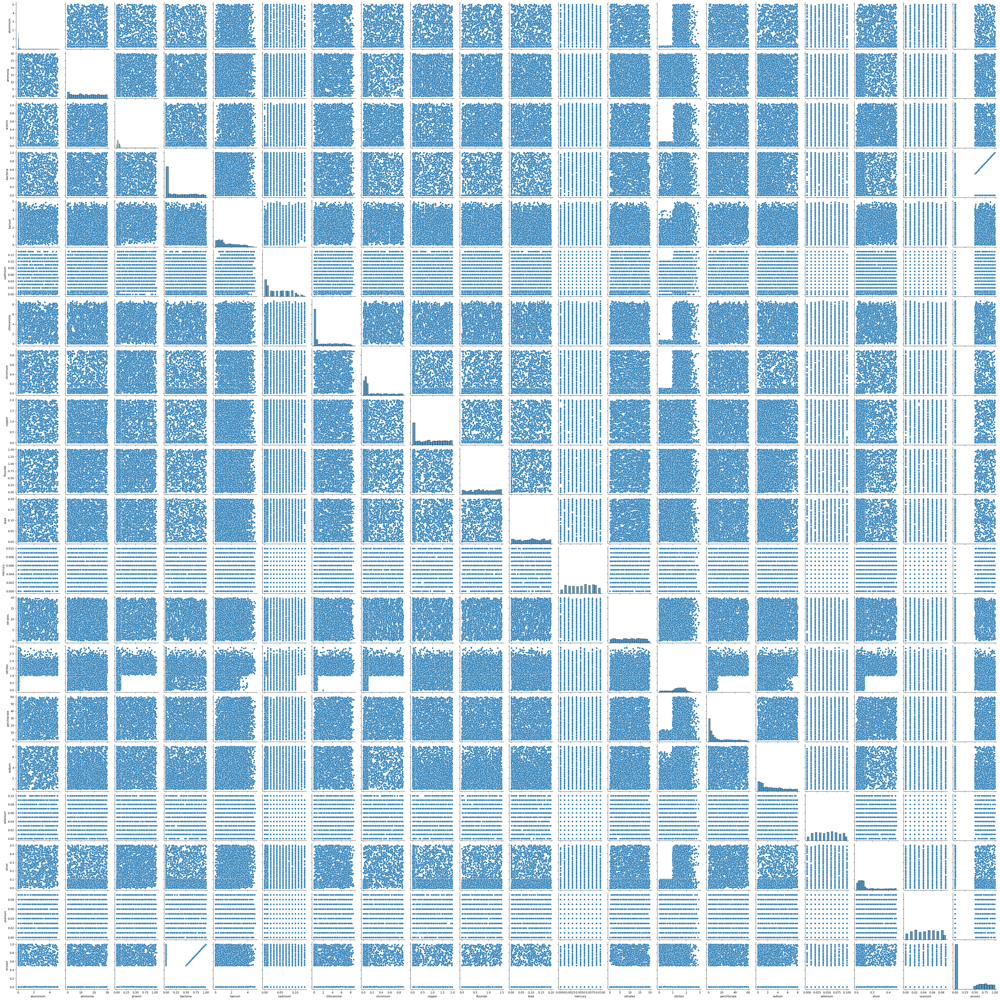

In [7]:
import seaborn as sns
sns.pairplot(df[df.columns.difference(['is_safe'])])

In [8]:
df.isna().sum()

aluminium      0
ammonia        0
arsenic        0
barium         0
cadmium        0
chloramine     0
chromium       0
copper         0
flouride       0
bacteria       0
viruses        0
lead           0
nitrates       0
nitrites       0
mercury        0
perchlorate    0
radium         0
selenium       0
silver         0
uranium        0
is_safe        0
dtype: int64

In [9]:
df.duplicated().sum()

np.int64(0)

In [10]:
print(df['is_safe'].value_counts())

is_safe
0    7084
1     912
Name: count, dtype: int64


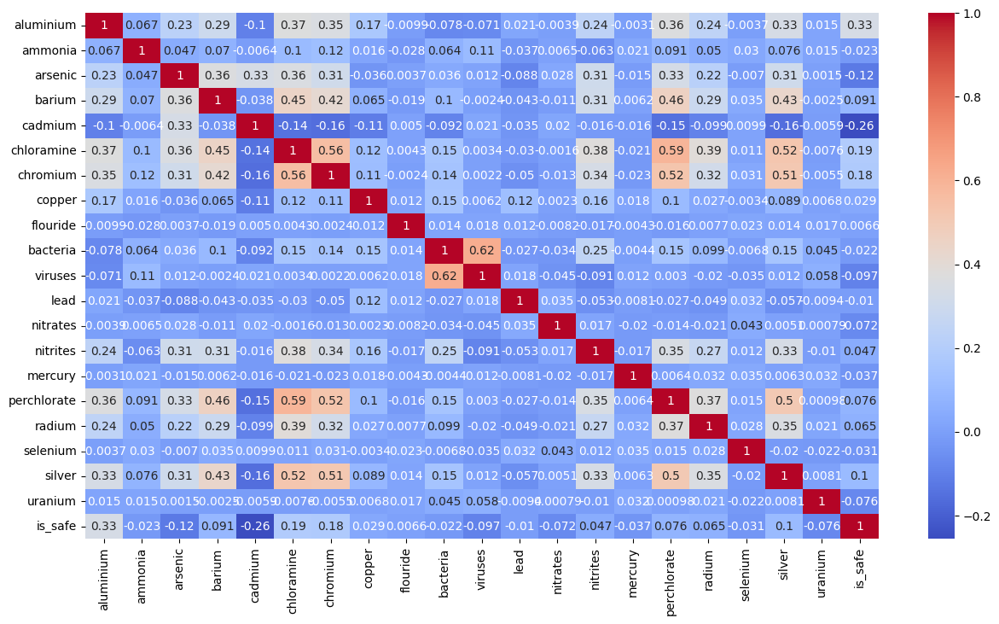

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.show()


## 2.Prepare Data

In [12]:
from sklearn.model_selection import train_test_split

x = df.drop(columns='is_safe')
y = df['is_safe']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, shuffle=True, random_state=42)
print(x_train.shape) 
print(y_train.shape)  
print(x_test.shape)  
print(y_test.shape)  

(6396, 20)
(6396,)
(1600, 20)
(1600,)


In [34]:
from sklearn.svm import SVC, LinearSVC
from sklearn.linear_model import SGDClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report


scaler = StandardScaler()
X_scaled = scaler.fit_transform(x_train)
X_test_scaled = scaler.transform(x_test)

In [14]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear'],
    'tol': [1e-3, 1e-4],
}

svc = SVC()
grid_search = GridSearchCV(svc, param_grid, cv=5, scoring='accuracy', verbose=1)

grid_search.fit(X_scaled, y_train)

print("Best parameters found: ", grid_search.best_params_)
print("Best score found: ", grid_search.best_score_)


Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best parameters found:  {'C': 0.1, 'kernel': 'linear', 'tol': 0.001}
Best score found:  0.9083805707584052


In [35]:
C = 0.1
alpha = 1 / (C * len(x_train))

lin_clf = LinearSVC(loss="hinge", C=C, max_iter=5000, random_state=42, class_weight='balanced')
svm_clf = SVC(kernel="linear", C=C, tol=1e-3, random_state=42,  class_weight='balanced')
sgd_clf = SGDClassifier(loss="hinge", learning_rate="constant", eta0=0.001, alpha=alpha,
                        max_iter=1000, tol=1e-3, random_state=42, class_weight='balanced')


In [36]:
lin_clf.fit(X_scaled, y_train)
print("LinearSVC:", lin_clf.intercept_, lin_clf.coef_)

LinearSVC: [-0.70389802] [[ 0.69331275 -0.07498352 -0.5595124   0.09590174 -0.462309    0.43481649
   0.27334483 -0.16398338  0.02781437  0.13031333 -0.34310314 -0.12069691
  -0.20878962 -0.15257603 -0.03485813 -0.11223522 -0.10127855 -0.15973071
  -0.18475055 -0.30877429]]


In [37]:
svm_clf.fit(X_scaled, y_train)
print("SVC:", svm_clf.intercept_, svm_clf.coef_)

SVC: [-0.70729305] [[ 0.69313203 -0.07361363 -0.55958437  0.0950745  -0.46324198  0.43620387
   0.27304924 -0.16352932  0.02834126  0.13103951 -0.34480033 -0.11976576
  -0.21000415 -0.15229554 -0.03445181 -0.11215257 -0.10225546 -0.15924192
  -0.18416044 -0.30993915]]


In [38]:
sgd_clf.fit(X_scaled, y_train)
print("SGDClassifier(alpha={:.5f}):".format(sgd_clf.alpha), sgd_clf.intercept_, sgd_clf.coef_)

SGDClassifier(alpha=0.00156): [-0.72304527] [[ 0.74085585 -0.06969718 -0.56485167  0.11628068 -0.44059572  0.4496658
   0.26125834 -0.1636682   0.05301534  0.15497806 -0.34062047 -0.10947595
  -0.22428825 -0.15385186 -0.01651998 -0.1036989  -0.10364773 -0.23092307
  -0.18635707 -0.26531513]]


In [39]:
y_pred_lin = lin_clf.predict(X_test_scaled)
y_pred_svm = svm_clf.predict(X_test_scaled)
y_pred_sgd = sgd_clf.predict(X_test_scaled)

print("LinearSVC Report:")
print(classification_report(y_test, y_pred_lin))

print("SVC Report:")
print(classification_report(y_test, y_pred_svm))

print("SGDClassifier Report:")
print(classification_report(y_test, y_pred_sgd))

LinearSVC Report:
              precision    recall  f1-score   support

           0       0.96      0.81      0.88      1400
           1       0.36      0.73      0.49       200

    accuracy                           0.81      1600
   macro avg       0.66      0.77      0.68      1600
weighted avg       0.88      0.81      0.83      1600

SVC Report:
              precision    recall  f1-score   support

           0       0.96      0.82      0.88      1400
           1       0.36      0.73      0.49       200

    accuracy                           0.81      1600
   macro avg       0.66      0.78      0.68      1600
weighted avg       0.88      0.81      0.83      1600

SGDClassifier Report:
              precision    recall  f1-score   support

           0       0.96      0.82      0.88      1400
           1       0.37      0.74      0.49       200

    accuracy                           0.81      1600
   macro avg       0.66      0.78      0.69      1600
weighted avg       0.8

In [40]:
from sklearn.metrics import confusion_matrix

cm_lin = confusion_matrix(y_test, y_pred_lin)
cm_svm = confusion_matrix(y_test, y_pred_svm)
cm_sgd = confusion_matrix(y_test, y_pred_sgd)

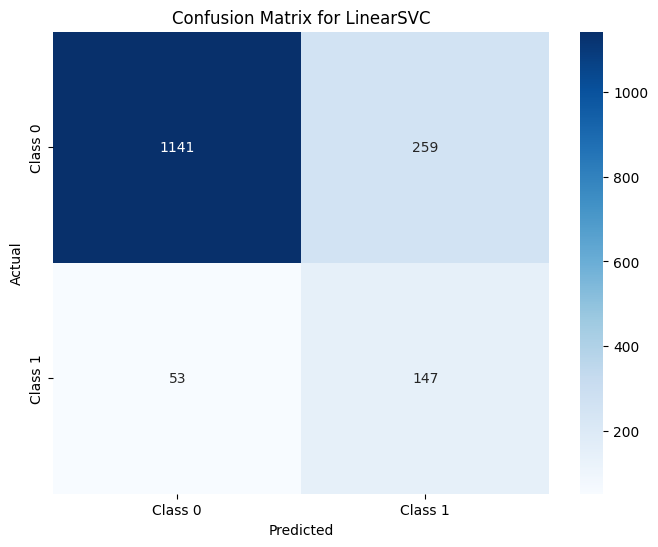

In [41]:
plt.figure(figsize=(8, 6))
sns.heatmap(cm_lin, annot=True, fmt="d", cmap="Blues", xticklabels=["Class 0", "Class 1"], yticklabels=["Class 0", "Class 1"])
plt.title("Confusion Matrix for LinearSVC")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

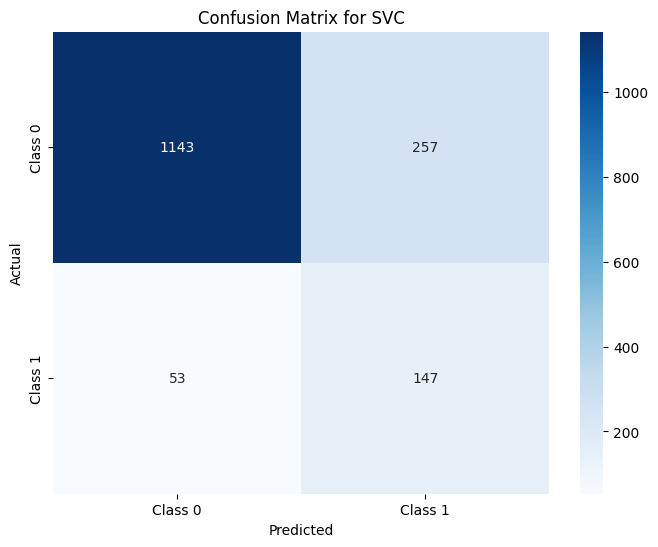

In [42]:
plt.figure(figsize=(8, 6))
sns.heatmap(cm_svm, annot=True, fmt="d", cmap="Blues", xticklabels=["Class 0", "Class 1"], yticklabels=["Class 0", "Class 1"])
plt.title("Confusion Matrix for SVC")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


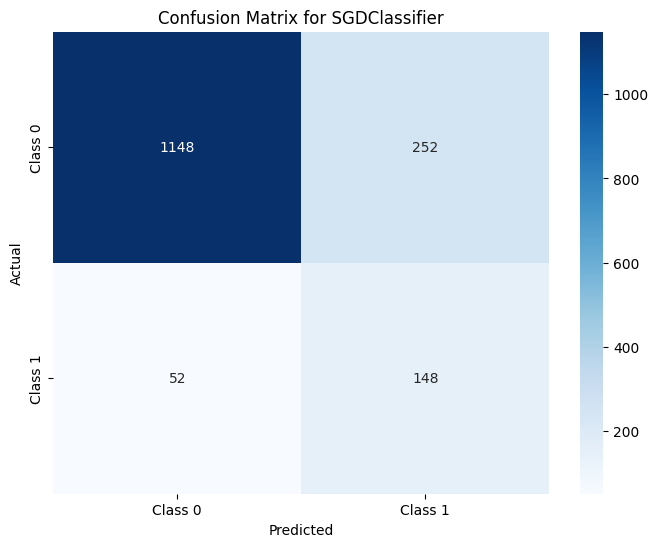

In [32]:
plt.figure(figsize=(8, 6))
sns.heatmap(cm_sgd, annot=True, fmt="d", cmap="Blues", xticklabels=["Class 0", "Class 1"], yticklabels=["Class 0", "Class 1"])
plt.title("Confusion Matrix for SGDClassifier")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()
